# Домашнее задание 2. Работа с изображениями

В этом задании предлагается решить простейшую задачу рапознавания лиц. Вам нужно будет научить модель для пары картинок определять, разные ли люди на них изображены.

Работать будем с датасетом фотографий известных людей. Скачать его можно [тут](https://disk.360.yandex.ru/d/oAmJgPESjP33hg). В нём представлены 150 человек, для каждого по 6-9 фотографий. Всего около 1000 изображений.

__Задание__. Вам потребуется выполнить два задания:

1) Реализовать модель бинарной классификации и добиться приемлемого качества.

2) Реализовать триплетную функцию потерь и улучшить качество предсказаний с ее помощью.

Напишите краткий отчёт о проделанных экспериментах. Что сработало и что не сработало? Почему вы решили, сделать так, а не иначе? Обязательно указывайте ссылки на чужой код, если вы его используете. Обязательно ссылайтесь на статьи / блогпосты / вопросы на stackoverflow / видосы от ютуберов-машинлернеров / курсы / подсказки от Дяди Васи и прочие дополнительные материалы, если вы их используете.

__Во всех заданиях будем придерживаться следующих правил__:
1. Использовать внешние данные для обучения строго запрещено. Также запрещено обучаться на валидационной выборке.
2. Все задания должны быть выполнены без использования предобученных моделей и готовых реализаций. Тем не менее:
    - В заданиях, где требуется достичь некоторого качества модели, разрешается использовать предобученные модели. Но __оценка за задние будет снижена__ (для каждого задания будет отдельно указано, на сколько).
    - В некоторых заданиях может сильно помочь библотека [pytorch-metric-learning](https://kevinmusgrave.github.io/pytorch-metric-learning/). Вы можете использовать готовые реализации из неё, но __максимальный балл за задание также будет снижен__.

__Советы и указания__:
 - Наверняка вам потребуется много гуглить о том, как заставить это всё работать. Это нормально, все гуглят. Но не забывайте, что нужно быть готовым за скатанный код отвечать :)
 - Рекомендуем использовать шаблоны ниже. Однако делать это мы не заставляем. Если вам так неудобно, то можете писать код в удобном стиле. Однако учтите, что чрезмерное изменение нижеперечисленных шаблонов увеличит количество вопросов к вашему коду :)
 - Валидируйте. Трекайте ошибки как можно раньше, чтобы не тратить время впустую.
 - Чтобы быстро отладить код, пробуйте обучаться на маленькой части датасета (скажем, 5-10 картинок просто чтобы убедиться что код запускается). Когда вы поняли, что смогли всё отдебажить, переходите обучению по всему датасету
 - На каждый запуск делайте ровно одно изменение в модели/аугментации/оптимайзере, чтобы понять, что и как влияет на результат.
 - Фиксируйте random seed.
 - Правильно нормализуйте данные при создании, пример [тык, но тут и в целом гайд от и до](https://www.pluralsight.com/guides/image-classification-with-pytorch)
 - Начинайте с простых моделей и постепенно переходите к сложным. Обучение лёгких моделей экономит много времени. Можно написать свою модель руками, а можно импортировать не предобученную сетку известной архитектуры из модуля `torchvision.models`. Один из способов как можно сделать: [документация (полезная)](https://pytorch.org/vision/stable/models.html)
 - Используйте все возможные методы оптимизации и эксперементируйте с ними.
 - Ставьте расписание на learning rate. Уменьшайте его, когда лосс на валидации перестаёт убывать.
 - Model Checkpointing. Сохраняйте свой прогресс (модели), чтобы когда что-то пойдет не так вы сможете начать с этого места или просто воспроизвести свои результаты модели, которые обучали.
    * Пример как можно с wandb тут: [Сохраняем лучшие модели в wandb](https://docs.wandb.ai/guides/integrations/lightning)
    * По простому можно так: [Сохраняем модели в pytorch дока](https://pytorch.org/tutorials/beginner/saving_loading_models.html)
 - Советуем использовать GPU. Если у вас его нет, используйте google colab. Если вам неудобно его использовать на постоянной основе, напишите и отладьте весь код локально на CPU, а затем запустите уже написанный ноутбук в колабе.

Good luck & have fun! :)

In [ ]:
import os
import tqdm
import numpy as np
import torch
import pandas
import random
import torchvision
import sklearn.metrics
import torch.utils.data
import matplotlib.pyplot as plt
import torchvision.transforms.v2

In [ ]:
# Можно использовать, но балл за соответствующие задания будет снижен.
import pytorch_metric_learning.distances
import pytorch_metric_learning.samplers
import pytorch_metric_learning.losses

In [ ]:
# Обязательно вызывайте эту функцию перед каждый запуском обучения!
# Если проверяющий не сможет воспроизвести результат, оценка за задание будет снижена.
def set_random_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.deterministic = True

    # также можно зафиксировать seed для Dataloader
    g = torch.Generator()
    g.manual_seed(seed)
    return g

# Сид для каждого worker в Dataloader
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### [1.5 балла] Часть 1. Подготовка данных.

##### [0.5 балла] Задание 1.1. Считать датасет.

Сначала нужно считать датасет с фотографиями и посмотреть на его устройство.

In [ ]:
from torchvision.datasets import ImageFolder
from torchvision.transforms import Compose, Normalize, ToTensor
from torch.utils.data import DataLoader

g = set_random_seed(42)

!unzip /content/data.zip

dataset = ImageFolder(
    root="/content/data/training",
    transform=ToTensor() #приводим изображения к тензорному типу
)

dataloader = DataLoader(dataset, batch_size=64, shuffle=False, worker_init_fn=seed_worker, generator=g)

Archive:  /content/data.zip
   creating: data/
   creating: data/testing/
   creating: data/testing/Albert_Costa/
  inflating: data/testing/Albert_Costa/Albert_Costa_0001.jpg  
  inflating: data/testing/Albert_Costa/Albert_Costa_0002.jpg  
  inflating: data/testing/Albert_Costa/Albert_Costa_0003.jpg  
  inflating: data/testing/Albert_Costa/Albert_Costa_0004.jpg  
  inflating: data/testing/Albert_Costa/Albert_Costa_0005.jpg  
  inflating: data/testing/Albert_Costa/Albert_Costa_0006.jpg  
   creating: data/testing/Cameron_Diaz/
  inflating: data/testing/Cameron_Diaz/Cameron_Diaz_0001.jpg  
  inflating: data/testing/Cameron_Diaz/Cameron_Diaz_0002.jpg  
  inflating: data/testing/Cameron_Diaz/Cameron_Diaz_0003.jpg  
  inflating: data/testing/Cameron_Diaz/Cameron_Diaz_0004.jpg  
  inflating: data/testing/Cameron_Diaz/Cameron_Diaz_0005.jpg  
  inflating: data/testing/Cameron_Diaz/Cameron_Diaz_0006.jpg  
   creating: data/testing/Mohamed_ElBaradei/
  inflating: data/testing/Mohamed_ElBaradei/M

In [ ]:
for batch, labels in dataloader:
    print(batch.shape)
    print(labels.shape)
    break

torch.Size([64, 3, 250, 250])
torch.Size([64])


In [ ]:
n_images = 0
mean = 0.0
std = 0.0

for batch, labels in dataloader:
    #[количество объектов, количество каналов, ширина, высота]
    batch = batch.view(batch.size(0), batch.size(1), -1) #вытягиваем изображения в векторы по каждому каналу
    #[количество объектов, количество каналов, ширина*высота]
    n_images += batch.size(0)
    mean += batch.mean(2).sum(0)
    std += batch.std(2).sum(0)

mean /= n_images
std /= n_images

print(mean)
print(std)

tensor([0.4299, 0.3747, 0.3324])
tensor([0.2703, 0.2435, 0.2338])


In [ ]:
g = set_random_seed(42)

transform = Compose(
    [
        ToTensor(), #приводим изображения к тензорному типу
        Normalize(mean, std), #нормализуем данные
    ]
)

train_ds = ImageFolder("data/training", transform = transform)
test_ds = ImageFolder("data/testing", transform = transform)

train_dataloader = DataLoader(
    train_ds, batch_size=32, shuffle=True, worker_init_fn=seed_worker, generator=g
)
test_dataloader = torch.utils.data.DataLoader(
    test_ds, batch_size=32, shuffle=False, worker_init_fn=seed_worker, generator=g
)

Давайте посмотрим на примеры фотографий. Нарисуйте несколько.

In [ ]:
def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

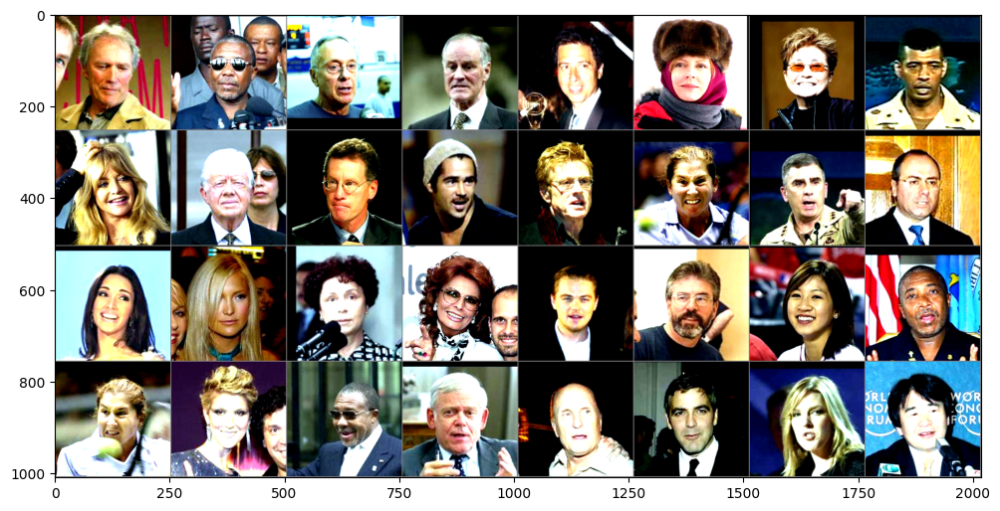

In [ ]:
images, labels = next(iter(train_dataloader))

plt.figure(figsize=(12, 12))
# create grid of images
img_grid = torchvision.utils.make_grid(images)
# show images
matplotlib_imshow(img_grid, one_channel=False)

Наконец, следует вывести распределение фотографий по людям и убедиться, что для каждого человека действительно предствалено 6-9 фотографий.

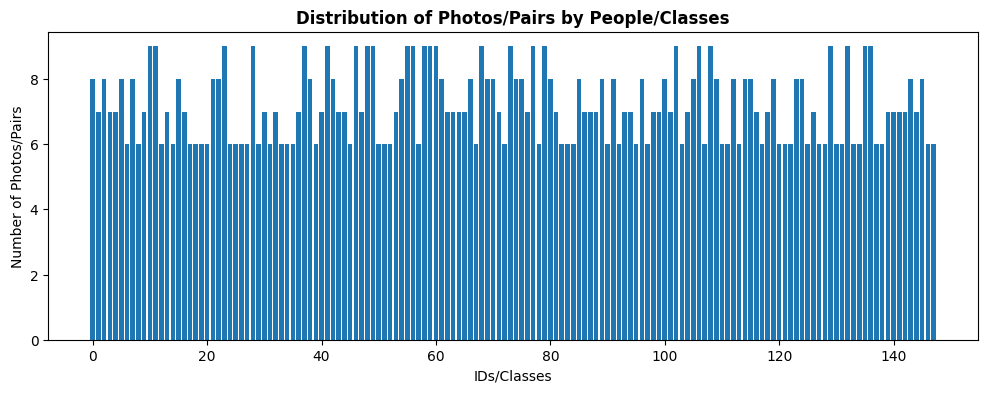

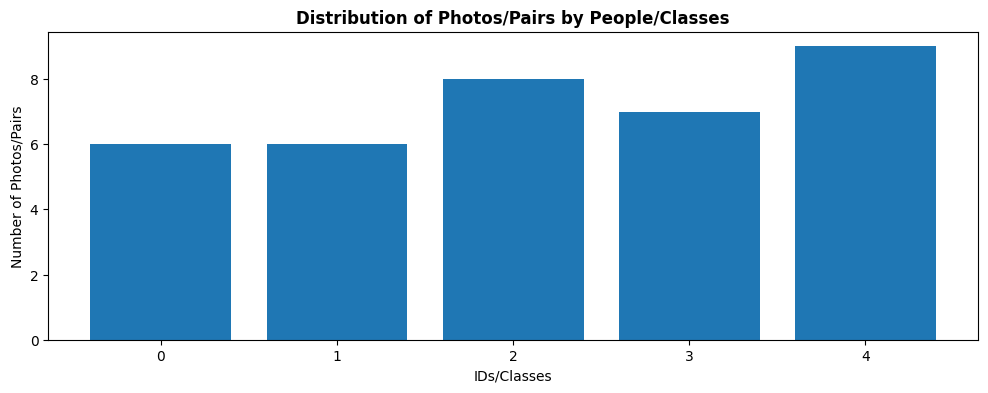

In [ ]:
def show_class_distribtion(targets):
    uniques, counts = np.unique(targets, return_counts=True)
    plt.figure(figsize=(12, 4))
    plt.bar(uniques, counts)
    plt.title("Distribution of Photos/Pairs by People/Classes", fontsize=12, weight="heavy")
    plt.xlabel("IDs/Classes")
    plt.ylabel("Number of Photos/Pairs")
    plt.show()

show_class_distribtion(train_ds.targets)
show_class_distribtion(test_ds.targets)

**Использованные источники:**

1.   https://www.pluralsight.com/resources/blog/guides/image-classification-with-pytorch
2. https://stackoverflow.com/questions/60101240/finding-mean-and-standard-deviation-across-image-channels-pytorch
3.   https://docs.pytorch.org/docs/stable/generated/torch.Tensor.view.html
4. https://docs.pytorch.org/docs/stable/size.html





##### [0 баллов] Задание 1.2. Датасет пар.

Как было сказано ранее, мы будем обучать модели предсказывать, разные ли люди изображены на фотографиях. Для этого нам надо научиться формировать пары фотографий и целевую переменную из двух классов: 0 и 1. \
Класс 0 означает, что это фотографии одного человека. \
Класс 1 означает фотографии разных людей. \
 \
К счастью, весь датасет уже написан.

In [ ]:
from tqdm.notebook import trange

class PairDataset(torch.utils.data.Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.targets = [ self._get_target(i) for i in trange(len(self)) ]

    def _idx1(self, idx):
        return idx % len(self.dataset)

    def _idx2(self, idx):
        return idx // len(self.dataset)

    def _get_target(self, idx):
        return int(self.dataset.targets[self._idx1(idx)] != self.dataset.targets[self._idx2(idx)])

    def __len__(self):
        return len(self.dataset) ** 2

    def __getitem__(self, idx):
        image1, label1 = self.dataset[self._idx1(idx)]
        image2, label2 = self.dataset[self._idx2(idx)]
        return image1, image2, int(label1 != label2)

train_pairs = PairDataset(train_ds)
test_pairs = PairDataset(test_ds)

  0%|          | 0/1134225 [00:00<?, ?it/s]

  0%|          | 0/1296 [00:00<?, ?it/s]

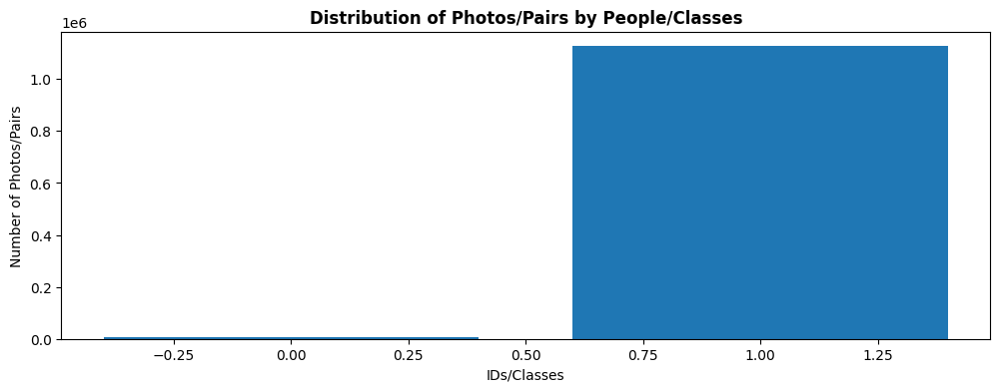

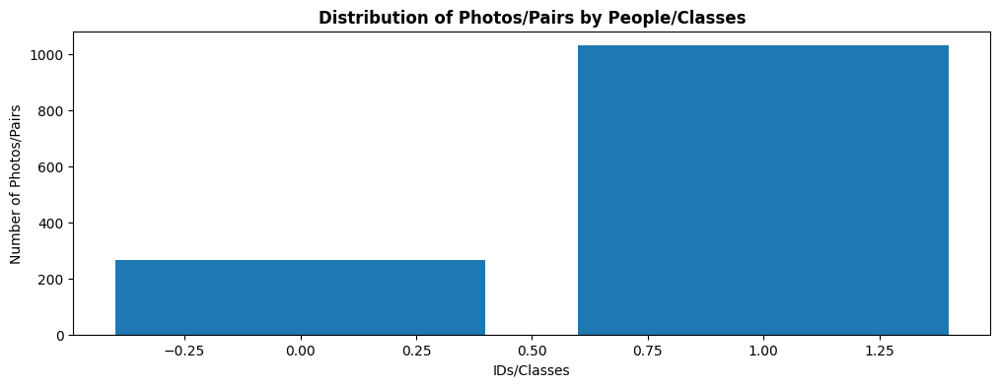

In [ ]:
show_class_distribtion(train_pairs.targets)
show_class_distribtion(test_pairs.targets)

Легко видеть, что пар фотографий разных людей гораздо больше, чем пар фотографий одного человека. Это вполне ожидаемо, но, если не предпринять мер, ведет к двум проблемам:
1. Метрика качества предсказаний должна учитывать дисбаланс классов. В частности, accuracy нам не подойдёт. А использовать будем известный из курса машинного обучения AUC-ROC.
2. Нужно "подтюнить" даталоадер тренировочных данных, чтобы в каждый батч попадало примерно одинаковое количество фотографий каждого класса. Иначе победить деградацию модели к "всегда 1" будет очень сложно.

##### [1 балл] Задание 1.3. Стратифицированный даталоадер.

Для начала решим вторую проблему. Нужно сделать такой даталоадер, чтобы в каждом батче количество элементов класса "0" совпадало с количеством элементов класса "1".

Как известно, стандартный класс `DataLoader` в torch имеет много параметров. В частности, параметр `sampler` позволяет гибко управлять выдачей. Изучите [документацию](https://docs.pytorch.org/docs/stable/data.html#data-loading-order-and-sampler) и реализуйте свой семплер, который решит проблему.

В `pytorch_metric_learning` уже есть готовая реализация того, что нам нужно. Вы можете её найти и использовать. Но в таком случае __максимальный балл за это задание - 0.4__.

In [ ]:
from torch.utils.data import Sampler

g = set_random_seed(42)

class MySampler(Sampler):
    def __init__(self, dataset, batch_size):
        self.dataset = dataset
        self.batch_size = batch_size
        self.targets = np.array(dataset.targets)

        assert batch_size % 2 == 0

        self.class0_indexes = np.where(self.targets == 0)[0]
        self.class1_indexes = np.where(self.targets == 1)[0]

    def __iter__(self):
        np.random.shuffle(self.class0_indexes)
        np.random.shuffle(self.class1_indexes)

        batches = []
        n_pairs_all = min(len(self.class0_indexes), len(self.class1_indexes))
        n_pairs_batch = self.batch_size // 2
        n_batches = n_pairs_all // (n_pairs_batch)

        for i in range(n_batches):
            class0_batch = self.class0_indexes[i*n_pairs_batch : (i+1)*n_pairs_batch]
            class1_batch = self.class1_indexes[i*n_pairs_batch : (i+1)*n_pairs_batch]
            batch = np.concatenate((class0_batch, class1_batch))
            np.random.shuffle(batch)
            batches.append(batch)

        for batch in batches:
            yield batch

    def __len__(self):
        n_pairs_all = min(len(self.class0_indexes), len(self.class1_indexes))
        n_pairs_batch = self.batch_size // 2
        n_batches = n_pairs_all // n_pairs_batch
        return n_batches

In [ ]:
g = set_random_seed(42)

train_pairs_sampler = MySampler(train_pairs, batch_size=32)

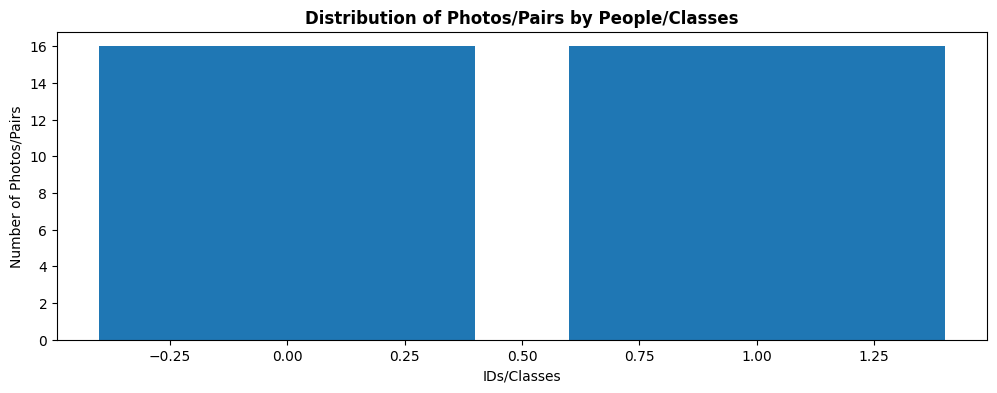

In [ ]:
train_pairs_loader = DataLoader(train_pairs, batch_sampler = train_pairs_sampler, worker_init_fn=seed_worker, generator=g)
test_pairs_loader = DataLoader(test_pairs, batch_size = 64, shuffle = False, worker_init_fn=seed_worker, generator=g)

# Убедимся, что теперь выдача равномерная.
show_class_distribtion(next(iter(train_pairs_loader))[2])

**Использованные источники:**


1.   https://docs.pytorch.org/docs/stable/data.html#torch.utils.data.Sampler



### [3.5 балла] Часть 2. Классификация.

Начнём с простого: попробуем решить проблему как обычную задачу бинарной классификации. Реализуйте и обучите обычную свёрточную сеть, которая принимает два набора фотографий и предсказывает вероятность, что это фотографии разных людей.

##### [1 балл] Задание 2.1. Модель классификации.

Сначала нужно реализовать модель. В `forward` необходимо принять два батча фотографий. `i`-e число в выводе `forward` должно быть предсказанием для пары из `i`-й фотографии `image1` и `i`-й фотографии `image2`. Подумайте, как это сделать. Возможно, стоит как-нибудь склеить `image1` и `image2`? Или склеить эмбеддинги? А может быть нужен какой-то трешхолд?

Вы вольны использовать любую архитектуру сети. Ассерт в конце ячейки поможет вам убедиться, что модель теоретически делает то, что нужно.

In [ ]:
from torch import nn

class ClassificationNet(nn.Module):
    def __init__(self):
        super(ClassificationNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(125*125*16, 128), #полносвязный слой
            nn.ReLU() #нелинейность
        )

        self.out = nn.Sequential(
            nn.Linear(1, 1),
            nn.Sigmoid()
        )

        self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, image1, image2):
        fc1 = self.fc(self.vgg(image1))
        fc2 = self.fc(self.vgg(image2))
        sim = (-self.cos(fc1, fc2)).unsqueeze(1)
        prob = self.out(sim)
        return prob.squeeze(1)

# Вы можете использовать этот ассерт в качестве теста, что ваша модель делает то, что нужно.
assert ClassificationNet()(*next(iter(train_pairs_loader))[:2]).shape == (32,)

**Использованные источники:**
1.   https://www.geeksforgeeks.org/computer-vision/algorithms-for-image-comparison/
2.   https://www.geeksforgeeks.org/computer-vision/vgg-net-architecture-explained/?ysclid=mhf82qoep9884607713
3. https://stackoverflow.com/questions/53803889/siamese-neural-network-in-pytorch



##### [2 балла] Задание 2.2. Обучение.

Теперь обучите свою модель и добейтесь приемлемого качества. Балл за это задание вычисляется по формуле:

$$ clamp(0, 2.5 \cdot \dfrac{AucRoc - 0.6}{0.2}, 2.5) $$

То есть, для получения полного балла за это задание необходимо добиться AUC-ROC `0.8`

__При использовани предобученных моделей, балл за это задание умножается на 0.5__ (то есть, не более 1)

In [ ]:
g = set_random_seed(42)

model = ClassificationNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = nn.BCELoss()

In [ ]:
from tqdm.notebook import tqdm

def training_epoch(model, optimizer, criterion, train_pairs_loader):

    model.train()
    train_loss_sum = 0

    for image1, image2, answer in tqdm(train_pairs_loader):
        image1 = image1.to(device)
        image2 = image2.to(device)
        answer = answer.float().to(device)

        optimizer.zero_grad()

        answer_pred = model(image1, image2)

        loss = criterion(answer_pred, answer)

        loss.backward()

        optimizer.step()

        train_loss_sum += loss.item()

    train_loss_mean = train_loss_sum / len(train_pairs_loader)

    return train_loss_mean

def train(model, optimizer, criterion, train_pairs_loader, epochs):

    train_loss = []

    for epoch in range(epochs):
        train_loss_epoch = training_epoch(model, optimizer, criterion, train_pairs_loader)

        train_loss.append(train_loss_epoch)

        print(f"Epoch: {epoch}, Train Loss: {train_loss_epoch:.4f}")

    return train_loss

In [ ]:
train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_pairs_loader=train_pairs_loader, epochs=4)

  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.7051


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.6952


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.6884


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.6845


In [ ]:
def get_score(auc_roc):
    return max(0, min(2.5 * (auc_roc - 0.6) / 0.2, 2.5))

def get_auc_roc(your_model):
    preds = []
    targets = []
    your_model.eval()
    for images1, images2, labels in tqdm(test_pairs_loader):
        with torch.no_grad():
            output = your_model(images1.to(device), images2.to(device))
        preds.extend(output.detach().cpu().tolist())
        targets.extend(labels.detach().cpu().tolist())
    preds = np.array(preds)
    targets = np.array(targets)
    return sklearn.metrics.roc_auc_score(targets, preds)

get_score(get_auc_roc(model))

  0%|          | 0/21 [00:00<?, ?it/s]

0

In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.5890


In [ ]:
g = set_random_seed(42)

model = ClassificationNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = nn.BCELoss()

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_pairs_loader=train_pairs_loader, epochs=4)

  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.6929


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.6847


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.6849


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.6782


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.5177


In [ ]:
g = set_random_seed(42)

model = ClassificationNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = nn.BCELoss()

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_pairs_loader=train_pairs_loader, epochs=4)

  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.6836


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.6610


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.6530


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.6280


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.6627


In [ ]:
class ClassificationNet(nn.Module):
    def __init__(self):
        super(ClassificationNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.LeakyReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.LeakyReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(125*125*16, 128), #полносвязный слой
            nn.LeakyReLU() #нелинейность
        )

        self.out = nn.Sequential(
            nn.Linear(1, 1),
            nn.Sigmoid()
        )

        self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, image1, image2):
        fc1 = self.fc(self.vgg(image1))
        fc2 = self.fc(self.vgg(image2))
        sim = (-self.cos(fc1, fc2)).unsqueeze(1)
        prob = self.out(sim)
        return prob.squeeze(1)

# Вы можете использовать этот ассерт в качестве теста, что ваша модель делает то, что нужно.
assert ClassificationNet()(*next(iter(train_pairs_loader))[:2]).shape == (32,)

In [ ]:
g = set_random_seed(42)

model = ClassificationNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = nn.BCELoss()

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_pairs_loader=train_pairs_loader, epochs=4)

  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.6807


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.6503


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.6200


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.5766


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7758


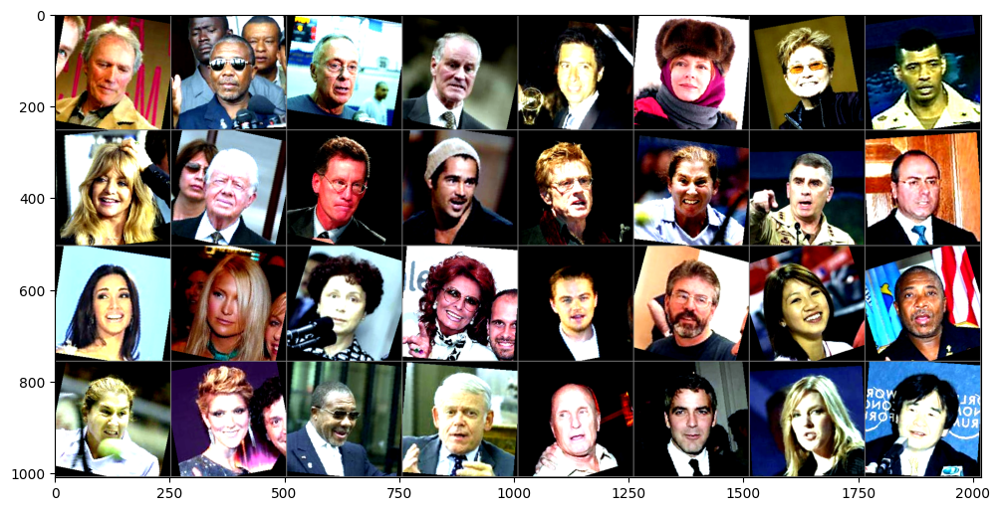

In [ ]:
import PIL
from torchvision.transforms import ColorJitter, RandomHorizontalFlip, RandomRotation

g = set_random_seed(42)

transform_aug = Compose(
    [
        ColorJitter(hue=0.05, saturation=0.05),
        RandomHorizontalFlip(),
        RandomRotation(20),
        ToTensor(),
        Normalize(mean, std),
    ]
)

train_ds_aug = ImageFolder("data/training", transform = transform_aug)

train_dataloader_aug = DataLoader(
    train_ds_aug, batch_size=32, shuffle=True, worker_init_fn=seed_worker, generator=g)

images, labels = next(iter(train_dataloader_aug))

plt.figure(figsize=(12, 12))
# create grid of images
img_grid = torchvision.utils.make_grid(images)
# show images
matplotlib_imshow(img_grid, one_channel=False)

In [ ]:
train_pairs_aug = PairDataset(train_ds_aug)

  0%|          | 0/1134225 [00:00<?, ?it/s]

In [ ]:
g = set_random_seed(42)

train_pairs_loader_aug = DataLoader(train_pairs_aug, batch_sampler = train_pairs_sampler, worker_init_fn=seed_worker, generator=g)

In [ ]:
g = set_random_seed(42)

model = ClassificationNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = nn.BCELoss()

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_pairs_loader=train_pairs_loader_aug, epochs=4)

  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.6877


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.6728


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.6562


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.6456


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7865


In [ ]:
class ClassificationNet(nn.Module):
    def __init__(self):
        super(ClassificationNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.LeakyReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.LeakyReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(125*125*16, 128), #полносвязный слой
            nn.BatchNorm1d(128),
            nn.LeakyReLU(), #нелинейность
            nn.Dropout(0.5)
        )

        self.out = nn.Sequential(
            nn.Linear(1, 1),
            nn.Sigmoid()
        )

        self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, image1, image2):
        fc1 = self.fc(self.vgg(image1))
        fc2 = self.fc(self.vgg(image2))
        sim = (-self.cos(fc1, fc2)).unsqueeze(1)
        prob = self.out(sim)
        return prob.squeeze(1)

# Вы можете использовать этот ассерт в качестве теста, что ваша модель делает то, что нужно.
assert ClassificationNet()(*next(iter(train_pairs_loader))[:2]).shape == (32,)

In [ ]:
g = set_random_seed(42)

model = ClassificationNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = nn.BCELoss()

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_pairs_loader=train_pairs_loader_aug, epochs=4)

  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.6888


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.6680


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.6502


  0%|          | 0/490 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.6321


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.9259


In [ ]:
get_score(get_auc_roc(model))

  0%|          | 0/21 [00:00<?, ?it/s]

2.5

##### [0.5 балла] Задание 2.3. Анализ и отчет.

Опишите свои эксперименты. Проанализируйте результаты. Почему результаты получились не очень хорошими? Может быть, решать задачу через бинарную классификацию - не лучшая идея? Приведите не менее 3 аргументов, почему это так.

***Изначально мною была реализована бинарная классификация с простой архитектурой - функцией активации ReLU и двумя сверточными слоями. Далее я попробовала обучить ее с помощью разных оптимизаторов, лучше всего показал себя оптимизатор Adam. После этого я последовательно применила следующие преобразования: заменила функцию активации ReLU на более гладкую LeakyReLU (чтобы нейроны не «умирали» при отрицательных значениях), применила аугментации данных для обучения (чтобы сеть видела больше вариантов изображений и училась быть более устойчивой к поворотам, масштабам и освещению), добавила BatchNorm (чтобы стабилизировать и ускорить обучение) и Dropout (чтобы снизить переобучение). C каждым преобразованием качество модели на тестовой выборке росло и в конечном итоге AUC-ROC достиг 0.9259.***

***Однако подход бинарной классификации имеет свои ограничения:***
1. ***С увеличением числа знаменитостей (лиц) количество пар изображений растёт очень быстро. Из-за этого модель тратит много времени на «простые» пары (явно разных людей) и меньше внимания уделяет редким или сложным случаям (например, одинаковым людям с разными ракурсами или освещением), что снижает способность модели обобщать сложные зависимости.***
2. ***Модель бинарной классификации учится различать только те лица, что были в тренировочной выборке (она запоминает не универсальные паттерны (признаки), а конкретные пары - «одинаковые/разные»), поэтому она, вероятно, будет иметь плохую обобщающую способность на новых, неизвестных данных.***
3. ***Такой подход чувствителен к условиям съёмки — освещению, фону, выражению лица и ракурсу. Даже небольшие отличия могут сбить модель, потому что она не учится понимать, кто изображён на фотографии, а лишь запоминает различия между конкретными снимками. Поэтому, несмотря на высокие показатели на тесте, такая модель плохо масштабируется и уступает методам с эмбеддингами, где сеть учится находить устойчивые черты лица и сравнивать их независимо от внешних условий.***

### [5 баллов] Часть 3. Распознавание лиц.

Теперь попробуем использовать более хитрые методы, которые лучше подходят для решаемой задачи. В частности, триплетную функцию потерь. Далее наша модель будет не предсказывать вероятность для двух картинок, а формировать эмбеддинги для одной картинки таким образом, чтобы эмбеддинги фотографий одного человека были близки, а разных людей - далеки.

##### [2 балла] Задание 3.1. Триплетная функция потерь.

Напомним теорию. Пусть $A$ - произвольное изображение; $P$ - изображение того же человека (позитивный пример); $N$ - изображение любого другого человека (негативный пример); $f$ - наша нейронная сеть; $\alpha$ - гиперпараметр, отвечающий за желаемый “отступ” – расстояние между латентными представлениями изображений разных людей. Тогда функционал ошибки определяется следующим образом:

$$ L(A, P, N) = max(||f(A) - f(P)|| - ||f(A) - f(N)|| + \alpha, 0) $$

В этом задании вам необходимо реализовать этот функционал. Для удобства в дальнейшем, предлагается сразу реализовать batch-версию. Таким образом, на входе должно быть 2 параметра:
- Набор эмбеддингов размера (batch_size, embedding_size)
- Набор классов (номера людей, чьи это фотографии) размера (batch_size)

Ваша функция должна найти все тройки $(A, P, N)$ и вычислить лосс для них.

В `pytorch_metric_learning` уже есть готовая реализация. Вы можете её найти и использовать. Но в таком случае __максимальный балл за это задание - 0.5__.

In [ ]:
#from torch import nn

class BatchAllTripletLoss(nn.Module):
    def __init__(self, margin=1.0):
        super().__init__()
        self.margin = margin

    def forward(self, embeddings, labels):
        batch_size = embeddings.size(0)

        distances = torch.cdist(embeddings, embeddings, p=2, compute_mode="donot_use_mm_for_euclid_dist") #матрица с расстояниями между эмбеддингами

        labels = (labels.int()).view(-1, 1) #столбец с метками классов

        pos_examples = (labels == labels.T) & (~torch.eye(batch_size, dtype=torch.bool, device=labels.device))
        neg_examples = labels != labels.T

        anchors_triplet_losses = []
        for i in range(batch_size):
            pos_indexes = torch.where(pos_examples[i])[0]
            neg_indexes = torch.where(neg_examples[i])[0]

            if len(pos_indexes) == 0 or len(neg_indexes) == 0:
                continue

            AP_dist = distances[i][pos_indexes].view(-1, 1) #столбец с позитивными расстояниями
            AN_dist = distances[i][neg_indexes].view(1, -1) #строка с негативными расстояниями
            single_anchor_triplet_losses = torch.relu(AP_dist - AN_dist + self.margin)
            anchors_triplet_losses.append(single_anchor_triplet_losses.flatten())

        if len(anchors_triplet_losses) == 0:
            return torch.tensor(0.0, device=embeddings.device, requires_grad=True)
        else:
            batch_losses = torch.cat(anchors_triplet_losses)
            return batch_losses.mean()

In [ ]:
criterion = BatchAllTripletLoss(margin=0.25)

In [ ]:
# Вы можете использовать этот ассерт в качестве теста
embeddings = torch.tensor([
    [ 1., 2, 3 ],
    [ 1, 3, 4 ],
    [ 4, 5, 6 ]
])
labels = torch.tensor([ 1., 2, 1 ])
assert (criterion(embeddings, labels) - 2.6775) < 1e-4

In [ ]:
criterion(embeddings, labels)

tensor(2.6775)

**Использованные источники:**
1. https://www.kaggle.com/code/hirotaka0122/triplet-loss-with-pytorch
2. https://docs.pytorch.org/docs/stable/generated/torch.nn.TripletMarginLoss.html
3. https://docs.pytorch.org/docs/stable/generated/torch.cdist.html
4. https://github.com/pytorch/pytorch/issues/42479

##### [3 балла] Задание 3.2. Обучение.

Теперь обучите модель и добейтесь приемлемого качества. Балл за это задание вычисляется по формуле:

$$ clamp(0, 3 \cdot \dfrac{AucRoc - 0.8}{0.15}, 3) $$

То есть, для получения полного балла за это задание необходимо добиться AUC-ROC `0.95`

При необходимости, вы можете улучшить функцию потерь. Например, учитывать не все тройки, а только "сложные", как это умеет делать реализация в `pytorch_metric_learning`. Также подумайте над даталоадером. Возможно, имеет смысл брать в батч одинаковое количество фотографий каждого человека по аналогии с заданием 1.3? Тем не менее имейте в виду, что для получения полного балла за задание, вы должны реализовать все модификации самостоятельно, а не использовать готовые.

__При использовани предобученных моделей, балл за это задание умножается на 0.5__ (то есть, не более 1.5) \
__При использовани pytorch_metric_learning, балл за это задание уменьшается на 0.5 за каждое использование__

In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(125*125*16, 128), #полносвязный слой
        )

    def forward(self, image):
        return self.fc(self.vgg(image))

In [ ]:
#from tqdm.notebook import tqdm

def training_epoch(model, optimizer, criterion, train_loader):

    model.train()
    train_loss_sum = 0

    for image, answer in tqdm(train_loader):
        image = image.to(device)
        answer = answer.float().to(device)

        optimizer.zero_grad()

        answer_pred = model(image)

        loss = criterion(answer_pred, answer)

        loss.backward()

        optimizer.step()

        train_loss_sum += loss.item()

    train_loss_mean = train_loss_sum / len(train_loader)

    return train_loss_mean

def train(model, optimizer, criterion, train_loader, epochs):

    train_loss = []

    for epoch in range(epochs):
        train_loss_epoch = training_epoch(model, optimizer, criterion, train_loader)

        train_loss.append(train_loss_epoch)

        print(f"Epoch: {epoch}, Train Loss: {train_loss_epoch:.4f}")

    return train_loss

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2803


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2760


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1601


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1645


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1455


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1685


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1666


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1560


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1204


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1323


In [ ]:
def get_score(auc_roc):
    return max(0, min(3 * (auc_roc - 0.8) / 0.15, 3))

def get_auc_roc(your_model):
    preds = []
    targets = []
    your_model.eval()
    for images1, images2, labels in tqdm(test_pairs_loader):
        with torch.no_grad():
            emb1 = your_model(images1.to(device))
            emb2 = your_model(images2.to(device))
            # Вы можете изменить функцию расстояния между эмбеддингами, если считаете нужным
            dist = ((emb1 - emb2) ** 2).sum(dim = 1)
        preds.extend(dist.detach().cpu().tolist())
        targets.extend(labels.detach().cpu().tolist())
    preds = np.array(preds)
    targets = np.array(targets)
    return sklearn.metrics.roc_auc_score(targets, preds)

get_score(get_auc_roc(model))

  0%|          | 0/21 [00:00<?, ?it/s]

np.float64(0.5831082560770828)

In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8292


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.3479


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2751


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2064


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2006


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1958


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1909


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1576


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1708


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1569


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1834


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7889


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 12.4212


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 5.8849


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 2.7186


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 1.4776


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.6086


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.4799


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2925


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.3017


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2761


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.2631


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7270


In [ ]:
import torch.nn.functional as F

class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(125*125*16, 128), #полносвязный слой
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.6278


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1939


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1937


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1788


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1573


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1584


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1574


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1499


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1541


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1611


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1434


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8249


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1817


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2109


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2063


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1677


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1507


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1900


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1588


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1558


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1436


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1262


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8496


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(125*125*16, 128), #полносвязный слой
            nn.BatchNorm1d(128),
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1967


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1729


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1377


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1156


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1173


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1378


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1327


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1158


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1020


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.0880


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8426


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2300


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2017


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1500


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1490


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1620


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1407


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1305


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1734


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1319


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.0957


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8666


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2400


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2420


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2216


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1570


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1776


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1678


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1215


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1740


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1174


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1211


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8199


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1874


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2056


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1728


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1899


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1815


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1833


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1748


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1414


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1660


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1681


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8214


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2095


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1980


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2195


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1698


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1802


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1464


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1487


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1639


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1522


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1435


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8282


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2942


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2897


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2474


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2339


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1971


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1972


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2045


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1993


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1762


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1928


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7903


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*64, 128), #полносвязный слой
            nn.BatchNorm1d(128),
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2084


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1996


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1994


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1803


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1783


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2045


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1732


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1801


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1784


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1639


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7652


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2373


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2158


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2091


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1560


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1503


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1748


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1431


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1391


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1443


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1161


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8899


In [ ]:
get_score(get_auc_roc(model))

  0%|          | 0/21 [00:00<?, ?it/s]

np.float64(1.7983794437550182)

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2854


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2538


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2271


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2108


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2049


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1774


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2166


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1774


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1703


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1510


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8128


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*64, 256), #полносвязный слой
            nn.BatchNorm1d(256),
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2243


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1967


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1983


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1885


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2098


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1927


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1591


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2075


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1896


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1541


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7366


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1856


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2061


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1792


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1480


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1797


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1734


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1325


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1571


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1045


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1038


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8392


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2976


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2672


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1684


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1555


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1859


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1702


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1798


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1543


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1801


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1543


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8748


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(125*125*16, 256), #полносвязный слой
            nn.BatchNorm1d(256),
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2136


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1989


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2151


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1326


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1708


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1751


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1505


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1514


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1377


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1623


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7812


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1871


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2166


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1671


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1953


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1813


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2012


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1680


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1442


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1475


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1417


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8646


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2338


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2910


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2735


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2522


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2234


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1894


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1525


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1666


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2085


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1624


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8425


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(125*125*16, 256), #полносвязный слой 1
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 128), #полносвязный слой 2
            nn.BatchNorm1d(128)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1937


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2119


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1895


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1889


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1910


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1742


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1696


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1611


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1879


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1607


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7639


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2534


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1826


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2021


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1487


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2216


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1698


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1408


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1300


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1685


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1720


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8675


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2448


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2249


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2120


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2006


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1780


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1736


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2164


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1822


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2006


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1653


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8280


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*64, 256), #полносвязный слой 1
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 128), #полносвязный слой 2
            nn.BatchNorm1d(128)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2142


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1906


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1971


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2107


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1794


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1926


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1879


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1741


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1735


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1906


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7875


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1933


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2217


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1952


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2028


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1907


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1729


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1762


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1682


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1739


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1532


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8647


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2852


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2524


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2468


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1799


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2262


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2218


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2466


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2228


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1897


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1941


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7894


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*64, 256), #полносвязный слой 1
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 256), #полносвязный слой 2
            nn.BatchNorm1d(256)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2234


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2011


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2153


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2077


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1782


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1896


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1873


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1999


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1752


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1896


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7078


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1879


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1857


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2014


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1625


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1505


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1327


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1618


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1555


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1323


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1443


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8800


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2351


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2253


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2340


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2143


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2118


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1599


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2219


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1803


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1904


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1830


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7733


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*64, 256), #полносвязный слой 1
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 256), #полносвязный слой 2
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 128), #полносвязный слой 3
            nn.BatchNorm1d(128)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2144


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2264


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2028


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2300


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2113


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1853


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2289


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1741


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1731


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1736


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7321


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2187


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2266


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1872


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1879


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1946


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1759


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1989


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1683


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1445


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1437


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8243


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2160


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2538


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2466


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2259


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2262


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2026


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1967


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1872


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2534


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.2335


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7284


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*64, 256), #полносвязный слой 1
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 256), #полносвязный слой 2
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 256), #полносвязный слой 3
            nn.BatchNorm1d(256)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2276


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2433


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2295


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1894


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2151


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2134


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2069


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2004


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1781


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1636


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7501


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2057


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2081


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1680


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1769


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2040


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1454


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1565


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1274


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1572


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1328


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8390


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2318


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2569


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2456


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2170


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2090


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1820


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1455


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2236


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1996


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.2129


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7122


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(32),
            nn.ReLU(), #нелинейность
            nn.Conv2d(32, 32, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(32),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*128, 256), #полносвязный слой 1
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 256), #полносвязный слой 2
            nn.BatchNorm1d(256)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2123


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2181


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2180


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1858


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1825


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1618


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1936


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1836


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1591


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1313


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7794


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2460


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1756


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1971


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1598


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1781


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1930


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1705


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1714


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1564


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1449


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8347


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2172


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2348


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2285


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2085


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2522


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2205


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2043


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1885


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2166


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1801


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7248


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(32),
            nn.LeakyReLU(), #нелинейность
            nn.Conv2d(32, 32, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(32),
            nn.LeakyReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*128, 256), #полносвязный слой 1
            nn.BatchNorm1d(256),
            nn.LeakyReLU(),
            nn.Linear(256, 256), #полносвязный слой 2
            nn.BatchNorm1d(256)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2029


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2219


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1953


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1846


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1820


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1845


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1824


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1824


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1791


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1664


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7547


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2128


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1993


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1974


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1665


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1804


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1748


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1434


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1761


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1545


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1153


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8191


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2051


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2371


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2608


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2032


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2553


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2266


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1820


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2161


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2474


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1689


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8438


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(32),
            nn.LeakyReLU(), #нелинейность
            nn.Conv2d(32, 32, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(32),
            nn.LeakyReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*128, 512), #полносвязный слой 1
            nn.BatchNorm1d(512),
            nn.LeakyReLU(),
            nn.Linear(512, 256), #полносвязный слой 2
            nn.BatchNorm1d(256)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2109


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2073


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1947


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2014


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2150


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1973


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1623


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1765


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1651


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1646


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7709


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1920


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1635


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1816


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1944


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1945


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1481


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1576


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1575


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1601


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1314


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8457


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2819


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2663


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2552


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2377


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2586


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2506


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2176


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2274


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1866


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1807


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8253


In [ ]:
class EmbeddingNet(nn.Module):
    def __init__(self):
        super(EmbeddingNet, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(32),
            nn.LeakyReLU(), #нелинейность
            nn.Conv2d(32, 32, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(32),
            nn.LeakyReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*128, 512), #полносвязный слой 1
            nn.BatchNorm1d(512),
            nn.LeakyReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 256), #полносвязный слой 2
            nn.BatchNorm1d(256)
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2146


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2172


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2080


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2147


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2056


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2241


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2056


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2006


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2043


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.2007


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.6857


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2269


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1872


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1878


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2016


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2261


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1999


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1841


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1770


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1802


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1784


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8421


In [ ]:
g = set_random_seed(42)

model = EmbeddingNet().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

criterion = BatchAllTripletLoss(margin=0.25)

train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                                                   train_loader=train_dataloader_aug, epochs=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1876


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2505


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2086


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2101


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2004


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1960


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2137


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1866


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1902


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1971


In [ ]:
print(f"Test AUC-ROC: {get_auc_roc(model):.4f}")

  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7922


***Наилучшее качество показала модель с нормализацией выходных эмбеддингов, со слоями BatchNorm и с 3 свёрточными блоками, обученная на аугментированных данных с оптимизатором SGD momentum. AUC-ROC=0.8899. Попробуем подобрать margin:***

In [ ]:
class EmbeddingNetFinal(nn.Module):
    def __init__(self):
        super(EmbeddingNetFinal, self).__init__()
        self.vgg = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), #свёртка 1 (3 канала, 16 фильтров 3x3)
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.Conv2d(16, 16, kernel_size=3, padding=1), #свёртка 2
            nn.BatchNorm2d(16),
            nn.ReLU(), #нелинейность
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(31*31*64, 128), #полносвязный слой
            nn.BatchNorm1d(128),
        )

    def forward(self, image):
        emb = self.fc(self.vgg(image))
        emb_norm = F.normalize(emb, p=2, dim=1)
        return emb_norm

In [ ]:
margins = [0.1, 0.2, 0.25, 0.3, 0.4, 0.5]
results = {}

for margin in margins:
    print(f"Margin = {margin}")

    g = set_random_seed(42)
    model = EmbeddingNetFinal().to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9)
    criterion = BatchAllTripletLoss(margin=margin)

    train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                       train_loader=train_dataloader_aug, epochs=10)

    auc_roc = get_auc_roc(model)
    print(f"Test AUC-ROC: {auc_roc:.4f}\n")

    results[margin] = auc_roc

best_margin = max(results, key=results.get)
print("Best margin =", best_margin, "with AUC-ROC =", results[best_margin])

Margin = 0.1


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1233


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.0928


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.0772


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.0862


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.0829


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.0816


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.0899


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.0596


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.0575


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.0692


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8589

Margin = 0.2


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1547


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1759


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1817


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1689


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1511


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1476


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1392


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1067


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1301


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1243


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8279

Margin = 0.25


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2210


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2056


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1665


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1511


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1842


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1659


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1378


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1516


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1430


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1320


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8262

Margin = 0.3


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2542


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2165


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2334


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2308


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1912


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2062


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1904


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1840


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1690


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1616


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8233

Margin = 0.4


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.3388


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.3456


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2644


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2794


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2655


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2255


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.2573


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2662


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2296


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.2477


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8579

Margin = 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.4275


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.3163


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.3932


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.3103


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.4285


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.3421


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.3541


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.3751


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.3502


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.2577


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8224

Best margin = 0.1 with AUC-ROC = 0.8589386086575662


In [ ]:
margins = [0.1, 0.2, 0.25, 0.3, 0.4, 0.5]
results = {}

for margin in margins:
    print(f"Margin = {margin}")

    g = set_random_seed(42)
    model = EmbeddingNetFinal().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    criterion = BatchAllTripletLoss(margin=margin)

    train_loss = train(model=model, optimizer=optimizer, criterion=criterion,
                       train_loader=train_dataloader_aug, epochs=10)

    auc_roc = get_auc_roc(model)
    print(f"Test AUC-ROC: {auc_roc:.4f}\n")

    results[margin] = auc_roc

best_margin = max(results, key=results.get)
print("Best margin =", best_margin, "with AUC-ROC =", results[best_margin])


Margin = 0.1


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.1863


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1907


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1502


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1138


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1093


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1224


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1279


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1421


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1180


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.0898


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7482

Margin = 0.2


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2299


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.2121


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.1931


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2061


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2275


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1674


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1602


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1482


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1640


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1473


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8263

Margin = 0.25


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.2517


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.1827


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2205


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.1854


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.1519


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.1700


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.1754


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.1573


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.1594


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.1762


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.8234

Margin = 0.3


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.3720


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.3220


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.2777


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.2644


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.2430


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.3065


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.3170


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2615


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2274


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.2584


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7609

Margin = 0.4


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.3655


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.3764


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.3821


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.3090


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.3280


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.2826


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.3050


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.2460


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.2769


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.2573


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.7529

Margin = 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 0, Train Loss: 0.4749


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1, Train Loss: 0.4870


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 2, Train Loss: 0.4577


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 3, Train Loss: 0.3562


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 4, Train Loss: 0.3683


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 5, Train Loss: 0.3766


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 6, Train Loss: 0.3562


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 7, Train Loss: 0.3376


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 8, Train Loss: 0.3458


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 9, Train Loss: 0.3411


  0%|          | 0/21 [00:00<?, ?it/s]

Test AUC-ROC: 0.6223

Best margin = 0.2 with AUC-ROC = 0.8262938900649682


***Перебор порогов для триплетной функции потерь не помог в повышении качества модели.***

***Таблица со всеми тестируемыми моделями:***

![Эксперименты](https://drive.google.com/uc?export=view&id=1btBBN-qkFeAh_7DMFXxRNz0E1HQIUcUW
)

##### [0.1 балла] Бонус: распознай себя

В качестве бонуса, загрузите свою фотографию (можно не одну), пропустите ее через модель и определите, на кого из известных людей, по мнению модели, вы больше всего похожи.